# Exploratory Data Analysis

### Understanding Domain Shift in PlantCLEF 2025

In this notebook, we explore the **domain shift** between the **single-label training images** and the **multi-label test images** used in the PlantCLEF 2025 challenge. 

The goal is to better understand the data distributions and challenges, and visually compare representative samples to inform our modeling approach.

In [2]:
%load_ext autoreload
%autoreload 2

In [7]:
import os
import torch
from plantclef.config import get_device
import pandas as pd
from pathlib import Path
from rich import print as pp

print(f"PyTorch Version: {torch.__version__}")
device = get_device()
print(f"Using device: {device}")
# Get list of stored filed in cloud bucket
root = Path().resolve().parents[0]
print(root)
! date

PyTorch Version: 2.7.0+cu126
Using device: cpu
/teamspace/studios/this_studio/plantclef-vision
Sun May 25 08:45:09 UTC 2025


In [4]:
s3_data_dir = "/teamspace/s3_connections/fossil-leaves"
local_data_dir = "/teamspace/studios/this_studio/plantclef-vision/data/fossil-leaves"

In [5]:
general_fossil_dir = f"{local_data_dir}/General_Fossil_uncropped_v2.0"

image_paths = os.listdir(general_fossil_dir)
print(len(image_paths))

764


In [12]:
from datasets import Dataset as HFDataset, Image

In [14]:
general_fossil_dataset = HFDataset.from_dict(
    {
        "image": [f"{general_fossil_dir}/{image_path}" for image_path in image_paths],
        "label": [image_path.split("_")[0] for image_path in image_paths],
    }
)

general_fossil_dataset = general_fossil_dataset.cast_column(
    "image",
    Image(mode="RGB"),
)
# print(general_fossil_dataset)
general_fossil_dataset

Dataset({
    features: ['image', 'label'],
    num_rows: 764
})

In [ ]:
general_fossil_dataset

{'image': Image(mode='RGB', decode=True, id=None),
 'label': Value(dtype='string', id=None)}

In [18]:
[general_fossil_dataset[0]["image"]]

[<PIL.Image.Image image mode=RGB size=2668x6965>]

In [8]:
pp(image_paths[:10])

[
    'Fagaceae_Castaneophyllum_patagonicum_MPEF-Pb_MPEF-Pb-8275_uncropped.jpg',
    'Fabaceae_Caesalpinia_pecorae_DMNH_DMNH-9630_uncropped.jpg',
    'Fagaceae_Castaneophyllum_patagonicum_MPEF-Pb_MPEF-Pb-8257_uncropped.jpg',
    'Betulaceae_Alnus_parvifolia_DMNH_DMNH-[Stonerose]-F351_uncropped.jpg',
    'Cornaceae_Cornus_swingii_DMNH_DMNH-18839_uncropped.jpg',
    'Cunoniaceae_Cunoniaceae_sp. TY116_MPEF-Pb_LH02-1086_uncropped.jpg',
    'Cercidiphyllaceae_Archeampelos_lobatocrenata_DMNH_DMNH-7112_uncropped.jpg',
    'Betulaceae_Betula_leopoldae_DMNH_DMNH-[Stonerose]-E155_uncropped.jpg',
    'Euphorbiaceae_Macaranga_kirkjohnsonii_MPEF-Pb_MPEF-Pb 7990b_uncropped.jpg',
    'Juglandaceae_Juglandiphyllites_glabra_USNM_USNM-loc-42090-288_uncropped.jpg'
]

In [ ]:
!unzip /teamspace/s3_connections/fossil-leaves/General_Fossil_uncropped_v2.0.zip -d /teamspace/studios/this_studio/plantclef-vision/data/fossil-leaves

# Other

In [6]:
# path to data
data_path = f"{root}/data/parquet/"
train_path = f"{data_path}/train_pytorch_webinar_filtered"
test_path = f"{data_path}/test_2025_pytorch_webinar"

# read train/test data
train_df = pd.read_parquet(train_path)
test_df = pd.read_parquet(test_path)

# display data
print(train_df.shape)
display(train_df.head(3))
display(test_df.head(3))

(2020, 22)


,image_name,path,data,organ,species_id,obs_id,license,partner,author,altitude,...,gbif_species_id,species,genus,family,dataset,publisher,references,url,learn_tag,image_backup_url
0,28e2fbd0cc93d82d7de3ed5783c64816074955e0.jpg,/PlantCLEF2024/train/1356404/28e2fbd0cc93d82d7...,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00...,leaf,1356404,1000992998,cc-by-sa,None,carloz,60.0,...,5275012.0,Pteridium aquilinum (L.) Kuhn,Pteridium,Dennstaedtiaceae,plantnet,plantnet,https://identify.plantnet.org/fr/k-southwester...,https://bs.plantnet.org/image/o/28e2fbd0cc93d8...,train,https://lab.plantnet.org/LifeCLEF/PlantCLEF202...
1,47b5db375e741fdc09b5e133d5bfef0285aa695c.jpg,/PlantCLEF2024/train/1418612/47b5db375e741fdc0...,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00...,habit,1418612,2634386735,http://creativecommons.org/licenses/by-nc/4.0/,None,René Stalder,NaN,...,2728572.0,Carex firma Host,Carex,Cyperaceae,gbif,iNaturalist,https://www.inaturalist.org/photos/75173958,https://inaturalist-open-data.s3.amazonaws.com...,train,https://lab.plantnet.org/LifeCLEF/PlantCLEF202...
2,c6a6b172ab03374ad1bb713b7e7b37dd84f094a1.jpg,/PlantCLEF2024/train/1722578/c6a6b172ab03374ad...,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00...,habit,1722578,3802273349,http://creativecommons.org/licenses/by/4.0/,None,Eleftherios Katsillis,NaN,...,8241209.0,Daucus pumilus (L.) Hoffmanns. & Link,Daucus,Apiaceae,gbif,iNaturalist,https://www.inaturalist.org/photos/121766424,https://inaturalist-open-data.s3.amazonaws.com...,train,https://lab.plantnet.org/LifeCLEF/PlantCLEF202...


,image_name,path,data
0,CBN-PdlC-C4-20180723.jpg,/test/data/PlantCLEF/PlantCLEF2025/DataOut/tes...,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...
1,LISAH-BOU-0-30-20230512.jpg,/test/data/PlantCLEF/PlantCLEF2025/DataOut/tes...,b'\xff\xd8\xff\xdb\x00C\x00\x06\x04\x05\x06\x0...
2,CBN-PdlC-C4-20140811.jpg,/test/data/PlantCLEF/PlantCLEF2025/DataOut/tes...,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...


### Visualizing single-label training images 

These images come from a curated dataset of individual plant species. 
Each image contains one plant species and is labeled accordingly.
This is the data our model will use to learn visual representations.

In [7]:
train_df.columns

Index(['image_name', 'path', 'data', 'organ', 'species_id', 'obs_id',
       'license', 'partner', 'author', 'altitude', 'latitude', 'longitude',
       'gbif_species_id', 'species', 'genus', 'family', 'dataset', 'publisher',
       'references', 'url', 'learn_tag', 'image_backup_url'],
      dtype='object')

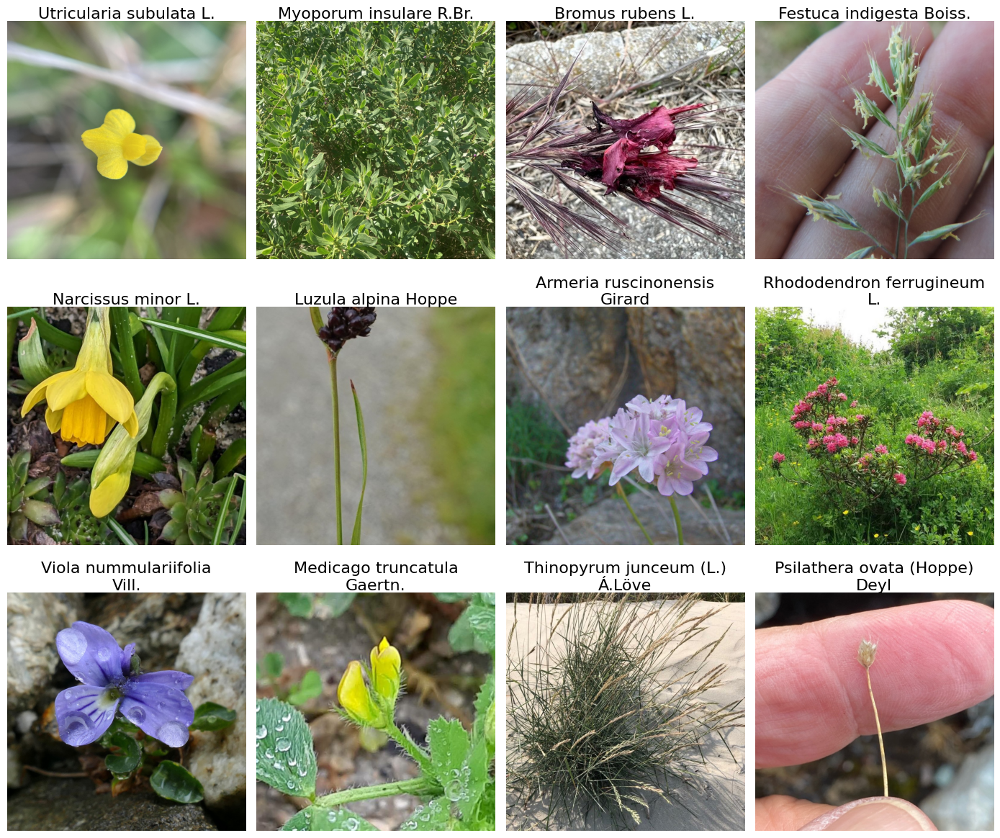

In [11]:
from plantclef.plotting import plot_images_from_binary


plot_images_from_binary(
    train_df.sample(50, random_state=43),
    data_col="data",
    label_col="species",
    grid_size=(3, 4),
    crop_square=True,
    figsize=(14, 12),
    dpi=100,
)

### Multi-label test images

The test set consists of real-world vegetation plots with multiple plant species present.
These complex, cluttered images are significantly different from the training data.

Let's visualize a few examples to highlight this domain shift.

In [12]:
# interesting test images
images = [
    "CBN-Pyr-03-20230706.jpg",
    "OPTMix-012-P2-207-20231201.jpg",
    "OPTMix-0178-P1-661-20231006.jpg",
    "OPTMix-0333-P2-115-20231212.jpg",
    "OPTMix-0598-P4-104-20231207.jpg",
    "RNNB-1-4-20240117.jpg",
    "RNNB-1-7-20230512.jpg",
    "RNNB-1-8-20230512.jpg",
    "RNNB-4-2-20240118.jpg",
    "RNNB-8-8-20240118.jpg",
    "CBN-can-E6-20230706.jpg",
    "CBN-Pla-A3-20140812.jpg",
]

In [14]:
test_df.count()

image_name    200
path          200
data          200
dtype: int64

In [13]:
# select subset of test dataframe
subset_test_df = test_df[test_df["image_name"].isin(images)]
subset_test_df.count()  # 12 images

image_name    12
path          12
data          12
dtype: int64

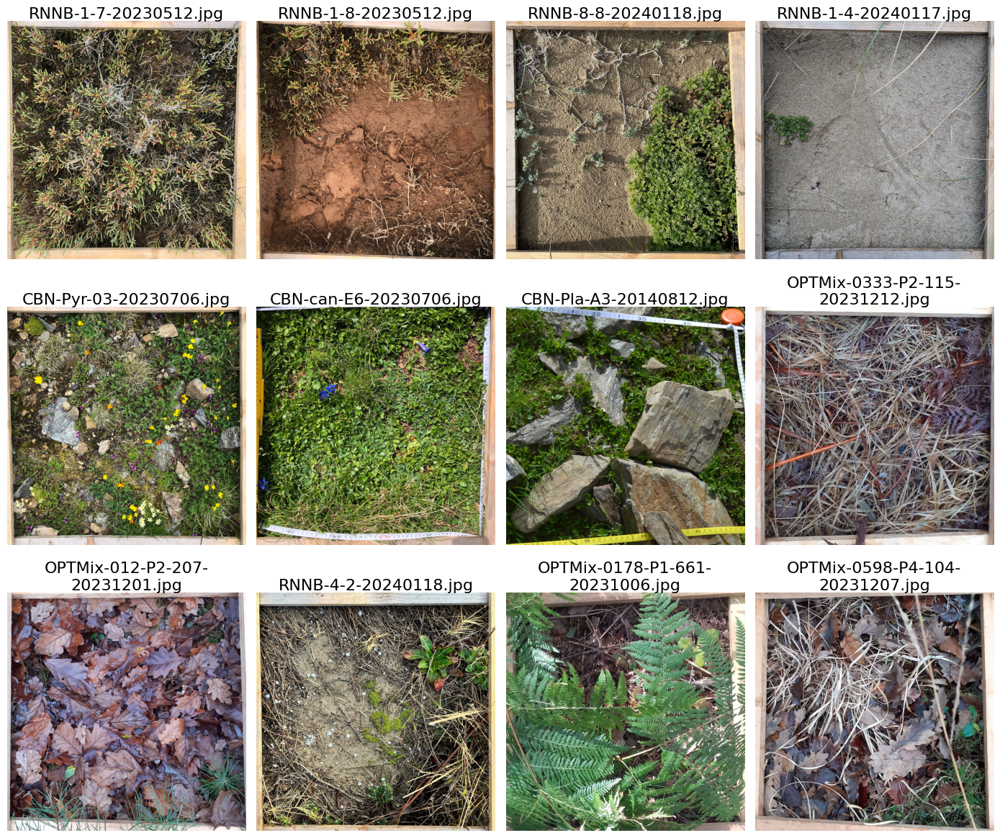

In [15]:
# display the images in a grid with binomial names
plot_images_from_binary(
    subset_test_df,
    data_col="data",
    label_col="image_name",
    grid_size=(3, 4),
    crop_square=True,
    figsize=(14, 12),
    dpi=100,
)

### Tiling images for patch-based inference

To handle **multi-label** high-resolution images, we divide test images into smaller tiles. This enables us to:
1. Extract feature embeddings from each tile for classsification.
2. Perform patch-wise inference using the ViT.
3. Aggregate predictions for multi-label output.

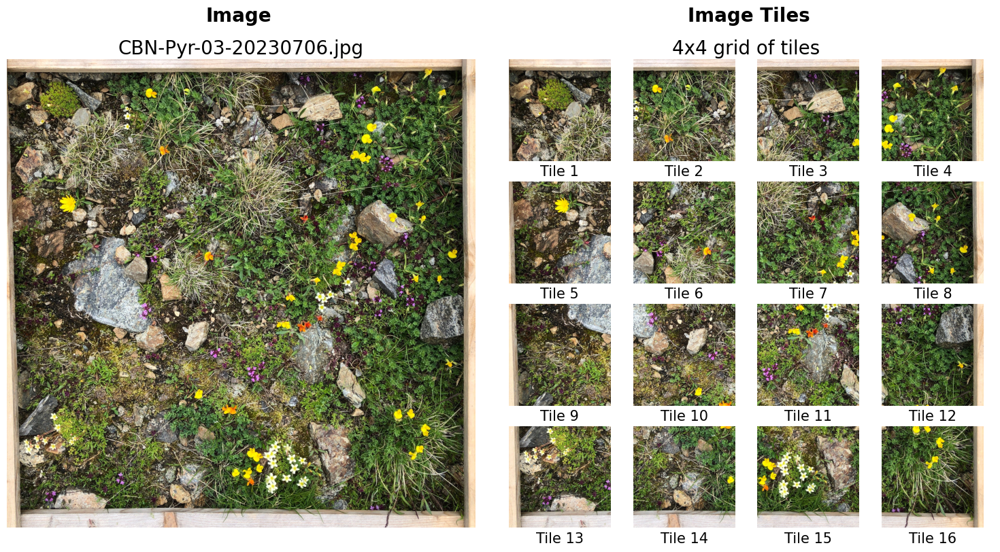

In [24]:
from plantclef.plotting import plot_image_tiles

# select image from test set
image_name = "CBN-Pyr-03-20230706.jpg"
test_image_df = test_df[test_df["image_name"] == image_name]

plot_image_tiles(
    test_image_df,
    data_col="data",
    grid_size=4,
)